# Дипломный проект
### Бриф «Лаборатории исследований гражданского общества»
# Государственные деньги у НКО
Выполнил Лукьяненко Владимир, radokast@gmail.com


Источник данных — проект «Открытые НКО»

Техническое задание состоит в проверке теорий, есть ли зависимость вероятности получения НКО грантов государства/госконтрактов от таких факторов как:

➔ регион регистрации организации;

➔ возраст организации;

➔ экономическая деятельность организации.

Стоит сделать важное замечание. Данные актуальны на 26.08.2021, т.е. относятся к ещё счастливым ковидным временам и носят скорее историографический характер. С февраля 2022 некоторые НКО лишились части своего финансирования, часть - и вовсе были ликвидированы, а монетарная политика государства и поддержка третичного сектора претерпевают значительные изменения. По-этому полученные выводы стоит применять с оглядкой на это.

Законодательство, регулирующее государственные деньги в третичном секторе:

Федеральный закон РФ от 12.01.1996 N 7-ФЗ (ред. от 31.07.2023) "О некоммерческих организациях"

Федеральный закон "О контрактной системе в сфере закупок товаров, работ, услуг для обеспечения государственных и муниципальных нужд" от 05.04.2013 N 44-ФЗ

Федеральный закон "О размещении заказов на поставки товаров, выполнение работ, оказание услуг для государственных и муниципальных нужд" от 21.07.2005 N 94-ФЗ

Федеральный закон "О закупках товаров, работ, услуг отдельными видами юридических лиц" от 18.07.2011 N 223-ФЗ 

In [1]:
import glob
import os
from datetime import datetime
import json as json
import ast

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pandas as pd
import numpy as np
import category_encoders as ce

from sklearn.preprocessing  import LabelEncoder
from sklearn import linear_model 
from sklearn import tree 
from sklearn import ensemble 
from sklearn import metrics 
from sklearn import preprocessing 
from sklearn.model_selection import train_test_split 
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.datasets import load_digits
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.pipeline import Pipeline
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import classification_report

import optuna
import pickle

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# Часть 1. Знакомство и обработка данных

In [2]:
#Читаем файлы

# folder_path = 'C:/IDE/goverment_finans_in_nonprofit_organizations_Russia/openngo_2021_26_08'
# json_files = glob.glob(os.path.join(folder_path, '*.json'))
# df = pd.DataFrame()

# # Проход по каждому файлу JSON и добавление его содержимого к общему датафрейму
# for file in json_files:
#     # Загрузка данных из JSON файла во временный датафрейм
#     temp_df = pd.read_json(file, lines=True)
    
#     # Объединение временного датафрейма с общим датафреймом
#     df = pd.concat([df, temp_df], ignore_index=True)

# # Сохранение датафрейма в CSV сжатый zip файл
# df.to_csv('D:\Data/data_npo.zip', compression='zip')

df = pd.read_csv('D:\Data/data_npo.zip', compression='zip')
foundations_codes = pd.read_csv('C:\IDE\goverment_finans_in_nonprofit_organizations_Russia/foundations_codes.csv')

C:\Users\Lukyanenko\AppData\Local\Temp\ipykernel_2580\1549282373.py:18: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('D:\Data/data_npo.zip', compression='zip')


In [3]:
df.head(1)

,Unnamed: 0,minjustRegNum,regionName,logo,statusDetail,fullName,dateReg,minjustForm,charter,minjustStatus,...,hasRegionalSupport,addOkved,okato,okfs,website_punycode,shortName,dateOgrn,predecessors,socialMedia,reports
0,0,7814061218.0,Санкт-Петербург,NaN,"{'name': None, 'code': None, 'shortName': 'Дей...",МЕЖРЕГИОНАЛЬНАЯ АНТРОПОСОФСКАЯ МЕДИЦИНСКАЯ АСС...,NaN,"Объединения (союз, ассоциация) юридических лиц",NaN,Зарегистрирована,...,False,[],"{'name': None, 'code': None}","{'name': None, 'code': None}",NaN,"""АМА""",{'$date': '2020-10-30T00:00:00.000Z'},[],"{'youtube': None, 'vk': None, 'facebook': None...",[]


### Характеристика и расшифровка данных

* addOkved: дополнительный ОКВЭД (тип: array, содержит элементы типа object)
* addOkved.code: код дополнительного ОКВЭД(тип: string)
* addOkved.name: расшифровка кода дополнительного ОКВЭД (тип: string)
* addOkved.version: версия дополнительного ОКВЭД (тип: string)
* address: юридический адрес (тип: string)
* administrators: руководители организации (тип: array, содержит элементы типа object)
* administrators.name: имя руководителя (тип: string)
* administrators.title: должность руководителя (тип: string)
* charter: ссылка на устав организации (тип: string, null)
* dateLiquid: дата ликвидации юрлица (тип: string, null)
* dateOgrn: дата присвоения ОГРН - начиная с 2002 года (тип: string)
* dateReg: дата регистрации организаций - указывается только для организаций, зарегистрированных до 2002 года (тип: string, null)
* egrulStatus: статус организации на основании данных ЕГРЮЛ. Варианты: Действует, Ликвидирована (тип: string)
* email: email организации (тип: string, null)
* foundersConfig: состав учредителей - только юрлица, только физлица или и те, и другие (тип: string, null)
* fullName: полное наименование организации (тип: string)
* hasRegionalSupport: наличие сведений о том, что организация была получателем региональной поддержки в качестве СО НКО (тип: boolean)
* incomeDetail: детализация сведений о доходах (тип: object)
* incomeDetail.contracts223: сведения о доходах от контрактации по 223-ФЗ (тип: object)
* incomeDetail.contracts223.[ГОД]: сведения о доходах от контрактации по 223-ФЗ в ... году (тип: object)
* incomeDetail.contracts223.[ГОД].count: число договоров по 223-ФЗ за ... год (тип: number)
* incomeDetail.contracts223.[ГОД].sum: сумма договоров по 223-ФЗ за ... год (тип: number)
* incomeDetail.contracts223.totalCount: общее число договоров по 223-ФЗ (тип: number)
* incomeDetail.contracts223.totalSum: общая сумма договоров по 223-ФЗ (тип: number)
* incomeDetail.contracts44: сведения о доходах от контрактации по 44-ФЗ (тип: object)
* incomeDetail.contracts44.[ГОД]: сведения о доходах от контрактации по 44-ФЗ в ... году (тип: object)
* incomeDetail.contracts44.[ГОД].count: число контрактов по 44-ФЗ за ... год (тип: number)
* incomeDetail.contracts44.[ГОД].sum: сумма контрактов по 44-ФЗ за ... год (тип: number)
* incomeDetail.contracts44.totalCount: общее число контрактов по 44-ФЗ (тип: number)
* incomeDetail.contracts44.totalSum: общая сумма контрактов по 44-ФЗ (тип: number)
* incomeDetail.contracts94: сведения о доходах от контрактации по 94-ФЗ (тип: object)
* incomeDetail.contracts94.[ГОД]: сведения о доходах от контрактации по 94-ФЗ в ... году (тип: object)
* incomeDetail.contracts94.[ГОД].count: число контрактов по 94-ФЗ за ... год (тип: number)
* incomeDetail.contracts94.[ГОД].sum: сумма контрактов по 94-ФЗ за ... год (тип: number)
* incomeDetail.contracts94.totalCount: общее число контрактов по 94-ФЗ (тип: number)
* incomeDetail.contracts94.totalSum: общая сумма контрактов по 94-ФЗ (тип: number)
* incomeDetail.fedSubsidies: сведения о соглашениях о предоставлении федеральных субсидий (тип: object)
* incomeDetail.fedSubsidies.[ГОД]: сведения о соглашениях о предоставлении федеральных субсидий в ... году (тип: object)
* incomeDetail.fedSubsidies.[ГОД].count: число соглашений за ... год (тип: number)
* incomeDetail.fedSubsidies.[ГОД].sum: (полная, необязательно уже выплаченная) сумма соглашений за ... год (тип: number)
* incomeDetail.fedSubsidies.totalCount: общее число соглашений (тип: number)
* incomeDetail.fedSubsidies.totalSum: общая (полная, необязательно уже выплаченная) сумма соглашений (тип: number)
* incomeDetail.grants: сведения о полученных президентских грантах (тип: object)
* incomeDetail.grants.[ГОД]: сведения о полученных президентских грантах за ... год (тип: object)
* incomeDetail.grants.[ГОД].count: число грантов за год (тип: number)
* incomeDetail.grants.[ГОД].sum: сумма грантов за год (тип: number)
* incomeDetail.grants.totalCount: общее число грантов (тип: number)
* incomeDetail.grants.totalSum: общая сумма грантов (тип: number)
* incomeRank: уровень дохода (тип: string)
* incomeTotal: общая сумма доходов из известных источников - контрактов, договоров, президентских грантов, федеральных субсидий (тип: number)
* inn: ИНН организации (тип: string, null)
* kpp: КПП организации (тип: string, null)
* logo: ссылка на изображение с логотипом организации (тип: string, null)
* mainOkved: сведения об основном ОКВЭД (тип: object)
* mainOkved.code: код основного ОКВЭД (тип: string, null)
* mainOkved.name: расшифровка кода основного ОКВЭД (тип: string, null)
* mainOkved.version: версия основного ОКВЭД (тип: string)
* minjustForm: форма НКО, согласно системе Минюста РФ - УНРО (тип: string, null)
* minjustRegNum: реестровый номер НКО в системе Минюста РФ - УНРО (тип: string, null)
* minjustStatus: статус НКО в системе Минюста РФ - УНРО. Варианты: Исключена, Действует (тип: string, null)
* ogrn: ОГРН организации (тип: string)
* okato: сведения об ОКАТО (тип: object)
* okato.code: код ОКАТО (тип: string, null)
* okato.name: расшифровка кода ОКАТО (тип: string, null)
* okfs: сведения об ОКФС (тип: object)
* okfs.code: код ОКФС (тип: string, null)
* okfs.name: расшифровка кода ОКФС (тип: string, null)
* okogu: сведения об ОКОГУ (тип: object)
* okogu.code: код ОКОГУ (тип: string, null)
* okogu.name: расшифровка кода ОКОГУ (тип: string, null)
* okpo: ОКПО (тип: string, null)
* oktmo: сведения об ОКТМО (тип: object)
* oktmo.code: код ОКТМО (тип: string, null)
* oktmo.name: расшифровка кода ОКТМО (тип: string, null)
* opf: сведения об организационно-правовой форме (ОПФ) организации на основании данных ЕГРЮЛ (тип: object)
* opf.code: код ОПФ (тип: string, null)
* opf.name: расшифровка кода ОПФ (тип: string)
* opf.version: версия классификатора ОПФ (тип: string)
* opfType: тип ОПФ - генерализованная категория организации, выведенная на основании ее ОПФ и формы по Минюсту РФ (тип: string)
* regionCode: код региона организации (тип: string)
* regionName: название региона организации (тип: string, null)
* reports: отчеты организации, поданные в Минюст РФ (тип: array, содержит элементы типа object)
* reports.localUrl: ссылка на PDF-копию отчета, размещенную на сервере проекта "Открытые НКО" (тип: string, null)
* reports.minjustUrl: ссылка на PDF-копию отчета, размещенную на сайте УНРО Минюста РФ (тип: string)
* reports.publishYear: год публикации отчета (тип: string)
* reports.reportId: ID отчета (тип: string)
* reports.reportYear: год отчета (тип: null)
* reports.type: тип отчета (тип: string)
* shortName: сокращенное наименование организации (тип: string, null)
* socialMedia: сведения об учетных записях организации в соцсетях (тип: object)
* socialMedia.facebook: адрес учетной записи в Facebook (тип: string, null)
* socialMedia.instagram: адрес учетной записи в Instagram (тип: string, null)
* socialMedia.ok: адрес учетной записи в "Одноклассниках" (тип: string, null)
* socialMedia.twitter: адрес учетной записи в Twitter (тип: string, null)
* socialMedia.vk: адрес учетной записи в VK (тип: string, null)
* socialMedia.youtube: адрес канала на YouTube (тип: string, null)
* website: домен вебсайта организации (тип: string, null)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 747034 entries, 0 to 747033
Data columns (total 39 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Unnamed: 0          747034 non-null  int64  
 1   minjustRegNum       462067 non-null  object 
 2   regionName          747009 non-null  object 
 3   logo                0 non-null       float64
 4   statusDetail        747034 non-null  object 
 5   fullName            747034 non-null  object 
 6   dateReg             321416 non-null  object 
 7   minjustForm         461073 non-null  object 
 8   charter             0 non-null       float64
 9   minjustStatus       462302 non-null  object 
 10  ogrn                747034 non-null  int64  
 11  opf                 747034 non-null  object 
 12  oktmo               747034 non-null  object 
 13  egrulStatus         747034 non-null  object 
 14  mainOkved           747034 non-null  object 
 15  regionCode          747034 non-nul

### Статус организации в Минюст и очистка по этому признаку

In [5]:
print('Статусы организаций в дата-сете:', df['minjustStatus'].unique())

Статусы организаций в дата-сете: ['Зарегистрирована' nan 'Исключена']


In [6]:
print('Доля всех доходов, приходящаяся на организации без статуса в минюсте: ', 
      round(df[df['minjustStatus'].isna()]['incomeTotal'].sum() / df['incomeTotal'].sum(), 3))
print('Доля всех доходов, приходящаяся на организации, исключенные из минюст:', 
      round(df[df['minjustStatus'] == "Исключена"]['incomeTotal'].sum() / df['incomeTotal'].sum(),3))

Доля всех доходов, приходящаяся на организации без статуса в минюсте:  0.04
Доля всех доходов, приходящаяся на организации, исключенные из минюст: 0.044


Таким образом, на долю нко в дата-сете, со статусоми исключенных и nan и пришлось 8.4%  от всех доходов. С одной стороны, это огромный блок важной информации. Однако, в контексте возможности госфинансирования нко в соответсвии со стремительно ужесточающейся законодательной базой и дифиците бюджетов, эти признаки можно считать ничтожными.

Удалим этот признак, в случае необходимости вернёмся к нему на следующей итерации.

In [7]:
# Удаляем все организации, имеющие статус "None" в Минюсте, так как организации с подобным статусом не могут финансироватсья государством
mask = (df['minjustStatus'] == "None") | (df['minjustStatus'] == "Исключена")
df = df.drop(df[mask].index, axis=0)
#Избавляесся от самого столбца за большей ненадобностью
df = df.drop(['minjustStatus'], axis=1)

### Дата создания организации

In [8]:
# посмотрим, как представлены строки признака даты регистрации (для организаций, основанных до 2002 года)
df['dateReg']

0                                           NaN
1                                           NaN
2                                           NaN
3                                           NaN
4                                           NaN
                          ...                  
747028                                      NaN
747029                                      NaN
747031    {'$date': '1998-01-01T00:00:00.000Z'}
747032    {'$date': '1987-12-05T00:00:00.000Z'}
747033    {'$date': '1990-10-23T00:00:00.000Z'}
Name: dateReg, Length: 491169, dtype: object

In [9]:
# посмотрим, как представлены строки признака даты регистрации - присвоение ОГРН (для организаций, основанных в 2002 году и позднее)
df['dateOgrn']

0         {'$date': '2020-10-30T00:00:00.000Z'}
1         {'$date': '2020-09-23T00:00:00.000Z'}
2         {'$date': '2020-02-03T00:00:00.000Z'}
3         {'$date': '2020-09-23T00:00:00.000Z'}
4         {'$date': '2020-07-08T00:00:00.000Z'}
                          ...                  
747028    {'$date': '2006-03-22T00:00:00.000Z'}
747029    {'$date': '2006-03-29T00:00:00.000Z'}
747031    {'$date': '2006-10-11T00:00:00.000Z'}
747032    {'$date': '2006-06-05T00:00:00.000Z'}
747033    {'$date': '2006-07-05T00:00:00.000Z'}
Name: dateOgrn, Length: 491169, dtype: object

In [10]:
#Функция, которая принимает дата-фрейм и колонки в строковом формате с информацией о датах, преобразует их в datetime на выходе
def extract_and_convert_date(data, columns):
    for column in columns:
        data[column] = data[column].str.replace("'", "\"") #json ругается на одиночные кавычки, заменяем -_\\
        data[column] = data[column].apply(lambda x: json.loads(x)['$date'] if pd.notna(x) else None)
        data[column] = pd.to_datetime(data[column], format='%Y-%m-%dT%H:%M:%S.%fZ', errors='coerce')
    return data

df = extract_and_convert_date(df, ['dateReg', 'dateOgrn'])

#Создадим новый признак - дату основания организации на основании двух столбцов
df['date_foundation'] = np.where(df['dateReg'].notna(), df['dateReg'], df['dateOgrn'])

# Сразу удаляем ставшие ненужными строки с датами регистрации
df = df.drop(['dateReg', 'dateOgrn'], axis=1)

df['date_foundation']

0        2020-10-30
1        2020-09-23
2        2020-02-03
3        2020-09-23
4        2020-07-08
            ...    
747028   2006-03-22
747029   2006-03-29
747031   1998-01-01
747032   1987-12-05
747033   1990-10-23
Name: date_foundation, Length: 491169, dtype: datetime64[ns]

### Регион регистрации организации

In [11]:
df['regionName'].describe()
# Отсутствуют некорректные данные в столбце regionName

count     491149
unique        86
top       Москва
freq       60408
Name: regionName, dtype: object

In [12]:
print('Доля всех доходов, приходящаяся на организации без указанного региона: ', 
      round(df[df['regionName'].isna()]['incomeTotal'].sum() / df['incomeTotal'].sum(), 3))

Доля всех доходов, приходящаяся на организации без указанного региона:  0.0


### Работа с реестровыми признаками и данными
Оставим уникальные значения для столбцов и создадим отдельные дата-фреймы со всеми встречающимися видами деятельности ОКВД, организационно-правовой формой, ОКОГУ (общероссийский классификатор органов госвласти и госуправления) и вида собсвтенности

In [13]:
#основной оквд у организаций

OKVD_dict = df['mainOkved'].unique()
OKVD_dict = [item.replace("'", "\"") for item in OKVD_dict]  # Заменяем одинарные кавычки на двойные

OKVD = []

for item in OKVD_dict:
    try:
        okvd = json.loads(item)  # Попробуем преобразовать строку в словарь
        OKVD.append(okvd)
    except json.JSONDecodeError:
        pass  # В данных есть несколько позиций с видом деятельности, описание которых некорректно, проигнорируем записи

OKVD = pd.DataFrame(OKVD)  # Преобразуем список словарей в датафрейм
OKVD

,name,code,version
0,Деятельность профессиональных членских организ...,94.12,ОК 029-2014 (КДЕС Ред. 2)
1,"Предоставление прочих финансовых услуг, кроме ...",64.99,ОК 029-2014 (КДЕС Ред. 2)
2,Деятельность в области права,69.10,ОК 029-2014 (КДЕС Ред. 2)
3,Управление недвижимым имуществом за вознагражд...,68.32,ОК 029-2014 (КДЕС Ред. 2)
4,Деятельность по организации конференций и выст...,82.30,ОК 029-2014 (КДЕС Ред. 2)
...,...,...,...
1969,Деятельность в области стандартизации и метрол...,74.20.4,ОК 029-2001 (КДЕС Ред. 1)
1970,Торговля розничная скобяными изделиями в специ...,47.52.1,ОК 029-2014 (КДЕС Ред. 2)
1971,Деятельность внутреннего водного пассажирского...,61.20.1,ОК 029-2001 (КДЕС Ред. 1)
1972,Оптовая торговля несельскохозяйственными проме...,51.5,ОК 029-2001 (КДЕС Ред. 1)


In [14]:
# Функция измения основной деятельности, оставит только код
def extract_main_okved_code(row):
    main_okved = eval(row)
    return main_okved.get('code', None)

# Преобразуем весь столбец основго дата-фрейма, оставляя только код деятельности
df['mainOkved'] = df['mainOkved'].apply(extract_main_okved_code)

In [15]:
#Дополнительный оквд, встречающийся у организаций

adOKVD_dict = df['addOkved'].unique()
adOKVD_dict = [item.replace("'", "\"") for item in adOKVD_dict]  # Заменяем одинарные кавычки на двойные

adOKVD = []

for item in adOKVD_dict:
    try:
        okvd = json.loads(item)  # Попробуем преобразовать строку в словарь
        adOKVD.append(okvd)
    except json.JSONDecodeError:
        pass  # В данных есть несколько позиций с видом деятельности, описание которых некорректно, проигнорируем записи

adOKVD = pd.DataFrame(adOKVD)  # Преобразуем список словарей в датафрейм
adOKVD.head()
# эта таблица уже выглядит неакурратно и разряженно: 71084 rows × 985 columns

,0,1,2,3,4,5,6,7,8,9,...,975,976,977,978,979,980,981,982,983,984
0,None,None,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
1,"{'name': 'Издание книг', 'code': '58.11', 'ver...","{'name': 'Издание газет', 'code': '58.13', 've...",{'name': 'Виды издательской деятельности прочи...,{'name': 'Издание аудиовизуальных произведений...,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
2,{'name': 'Аренда и управление собственным или ...,{'name': 'Покупка и продажа собственного недви...,None,None,None,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
3,{'name': 'Исследование конъюнктуры рынка и изу...,"{'name': 'Издание книг, брошюр, рекламных букл...",{'name': 'Деятельность зрелищно-развлекательна...,{'name': 'Образование дополнительное детей и в...,{'name': 'Предоставление прочих социальных усл...,{'name': 'Деятельность в сфере связей с общест...,None,None,None,None,...,None,None,None,None,None,None,None,None,None,None
4,"{'name': 'Печатание газет', 'code': '18.11', '...","{'name': 'Издание книг', 'code': '58.11', 'ver...",{'name': 'Издание журналов и периодических изд...,{'name': 'Виды издательской деятельности прочи...,{'name': 'Деятельность зрелищно-развлекательна...,{'name': 'Предоставление социальных услуг без ...,{'name': 'Деятельность по организации конферен...,{'name': 'Деятельность в сфере связей с общест...,{'name': 'Предоставление услуг по дневному ухо...,None,...,None,None,None,None,None,None,None,None,None,None


In [16]:
# Функция для разбора строки addokvd и извлечения значений 'code' в список
def extract_add_okved_codes(row):
    try:
        add_okved = ast.literal_eval(row)
        if isinstance(add_okved, list):
            return [item.get('code', None) for item in add_okved]  # Извлекаем значения 'code'
        else:
            return []  # Если не список, возвращаем пустой список
    except (ValueError, SyntaxError):
        return []  # Если возникает ошибка разбора, возвращаем пустой список

df['addOkved'] = df['addOkved'].apply(extract_add_okved_codes)


In [17]:
#подобный столбец будет сложно использовать, чтобы попытаться извлечь толику полезной информации, сделаем ещё столбец с указанием количества вторичных видов деятельности
df['addOkvd_number'] = df['addOkved'].apply(lambda x: len(eval(x)) if isinstance(x, str) else 0)

In [18]:
opf_dict = df['opf'].unique()
opf_dict = [item.replace("'", "\"") for item in opf_dict]  # Заменяем одинарные кавычки на двойные

opf = []

for item in opf_dict:
    try:
        opf_item = json.loads(item)  # Попробуем преобразовать строку в словарь
        opf.append(opf_item)
    except json.JSONDecodeError:
        pass  # В данных есть несколько позиций с организационно-правовой формой, описание которых некорректно, проигнорируем записи

opf = pd.DataFrame(opf)  # Преобразуем список словарей в датафрейм
opf

,name,code,version
0,Ассоциации (союзы),20600,okopf
1,Фонды,70400,okopf
2,Коллегии адвокатов,20616,okopf
3,Товарищества собственников недвижимости,20700,okopf
4,Автономные некоммерческие организации,71400,okopf
...,...,...,...
130,Адвокатские палаты,20801,okopf
131,Благотворительные фонды,20401,okopf
132,Учреждения религиозных организаций,20908,okopf
133,Государственные компании,28004,okopf


In [19]:
# Функция измения организационно-правовой формы, оставит только код
def map_opf_detail(row):
    status_detail = eval(row)  # Преобразуем строку в словарь
    return status_detail['code']

df['opf'] = df['opf'].apply(map_opf_detail)

In [20]:
okogu_dict = df['okogu'].unique()
okogu_dict = [item.replace("'", "\"") for item in okogu_dict]  # Заменяем одинарные кавычки на двойные

okogu = []

for item in okogu_dict:
    try:
        okogu_item = json.loads(item)  # Попробуем преобразовать строку в словарь
        okogu.append(okogu_item)
    except json.JSONDecodeError:
        pass  # В данных есть несколько позиций с видом деятельности государсвенного управления, описание которых некорректно, проигнорируем записи

okogu = pd.DataFrame(okogu)  # Преобразуем список словарей в датафрейм
okogu

,name,code
0,Региональные и местные общественные объединения,4220003
1,"Организации, учрежденные юридическими лицами и...",4210014
2,Международные общественные объединения,4220004
3,Органы исполнительной власти субъектов Российс...,2300231
4,Муниципальные организации,4210007
5,Местные администрации (исполнительно-распоряди...,3300100
6,Органы исполнительной власти субъектов Российс...,2300229
7,Приватизированные предприятия,4210008
8,"Акционерные общества, товарищества, сельскохоз...",4210004
9,Министерство культуры Российской Федерации,1321000


In [21]:
# Функция измения видов деятельности государсвенного управления, оставит только код
def map_okogu_detail(row):
    status_detail = eval(row)  # Преобразуем строку в словарь
    return status_detail['code']

df['okogu'] = df['okogu'].apply(map_okogu_detail)

In [22]:
#вид собственности у организаций

okfs_dict = df['okfs'].unique()
okfs_dict = [item.replace("'", "\"") for item in okfs_dict]  # Заменяем одинарные кавычки на двойные

okfs = []

for item in okfs_dict:
    try:
        okfs_item = json.loads(item)  # Попробуем преобразовать строку в словарь
        okfs.append(okfs_item)
    except json.JSONDecodeError:
        pass  # В данных могут быть строки, описание которых некорректно, проигнорируем записи

okfs = pd.DataFrame(okfs)  # Преобразуем список словарей в датафрейм
okfs

,name,code
0,Собственность профессиональных союзов,52
1,Частная собственность,16
2,Собственность общественных объединений,53
3,Иная смешанная российская собственность,49
4,Собственность субъектов Российской Федерации,13
5,Смешанная российская собственность с долей соб...,42
6,Муниципальная собственность,14
7,Смешанная российская собственность с долями фе...,43
8,Смешанная российская собственность с долей фед...,41
9,Федеральная собственность,12


In [23]:
# Функция измения строк формы собственности, оставит только код
def map_okfs_detail(row):
    status_detail = eval(row)  # Преобразуем строку в словарь
    return status_detail['code']

df['okfs'] = df['okfs'].apply(map_okfs_detail)

In [24]:
#Взглянем на уникальные значения статуса
df['statusDetail'].unique()

array(["{'name': None, 'code': None, 'shortName': 'Действующая'}",
       "{'name': 'Юридическим лицом принято решение об изменении места нахождения', 'code': '112', 'shortName': 'Действующая'}",
       "{'name': 'Находится в стадии ликвидации', 'code': '101', 'shortName': 'Ликвидируется'}",
       "{'name': 'Регистрирующим органом принято решение о предстоящем исключении юридического лица из ЕГРЮЛ (недействующее юридическое лицо)', 'code': '105', 'shortName': 'Недействующая'}",
       "{'name': 'Регистрирующим органом принято решение о предстоящем исключении юридического лица из ЕГРЮЛ (наличие в ЕГРЮЛ сведений о юридическом лице, в отношении которых внесена запись о недостоверности)', 'code': '107', 'shortName': 'Недействующая'}",
       "{'name': 'Регистрация признана ошибочной по решению регоргана', 'code': '801', 'shortName': 'Недействующая'}",
       "{'name': 'Находится в процессе реорганизации в форме преобразования', 'code': '121', 'shortName': 'Реорганизуется'}",
       "{'nam

In [25]:
#функция, возвращающуя конкретный статус организации
def map_status_detail(row):
    status_detail = eval(row)  # Преобразуем строку в словарь
    return status_detail['shortName']

# Применяем функцию к столбцу 'statusDetail' и создаем новый столбец 'status'
df['status'] = df['statusDetail'].apply(map_status_detail)

df = df.drop('statusDetail', axis=1)

In [26]:
# переведём дату ликвидации в формат datetime
df = extract_and_convert_date(df, ['dateLiquid'])

In [27]:
df[df['incomeTotal'] != '0.0']
df['incomeTotal'] = df['incomeTotal'].astype(float)

In [28]:
#Просмотрим долю ликвидированных организаций от общего количества всех выделенных средств - она составляет 0,3%, что незначительно для общей картины.
df[df['egrulStatus'] == 'Ликвидирована']['incomeTotal'].sum() / df['incomeTotal'].sum()
#0.0028849204034380946

#Избавимся от всех организаций, имеющих статус ликвидированных
df = df[df['egrulStatus'] != 'Ликвидирована']

### Информация о социальных медиа

In [29]:
print('Это все уникальные данные для столбца социальных медиа на весь датасет:')
print(df['socialMedia'].unique())
# организаций, у которых заполнена информация о social Media ничтожно мало, избавляеся от признака
df = df.drop(['socialMedia'], axis=1)

Это все уникальные данные для столбца социальных медиа на весь датасет:
["{'youtube': None, 'vk': None, 'facebook': None, 'twitter': None, 'instagram': None, 'ok': None}"
 "{'youtube': None, 'vk': 'https://vk.com/1school_ru', 'facebook': 'https://www.facebook.com/Umnichka.1School/', 'twitter': None, 'instagram': None, 'ok': None}"
 "{'youtube': None, 'vk': 'http://vk.com/jfc.adainlo', 'facebook': 'https://www.facebook.com/jfc.adainlo', 'twitter': 'https://twitter.com/AdainLo', 'instagram': None, 'ok': None}"
 "{'youtube': None, 'vk': None, 'facebook': 'https://www.facebook.com/groups/1539321169630366', 'twitter': None, 'instagram': None, 'ok': None}"
 "{'youtube': 'https://www.youtube.com/channel/UCrvpLTGyRHL0dNvfLTWBa7A', 'vk': 'https://vk.com/tvcrimea24', 'facebook': 'https://www.facebook.com/tvcrimea24', 'twitter': 'https://twitter.com/news_crimea24', 'instagram': 'https://www.instagram.com/crimea24news', 'ok': 'https://ok.ru/profile/571423584860'}"
 "{'youtube': 'https://www.youtub

### Обработка целевого показателя
Обработаем целевой показатель - доходы нко от государства

In [30]:
# Функция для извлечения признаков дохода из строки в соответствии с техническим описанием данных
def extract_features(row):
    try:
        income_dict = ast.literal_eval(row)
        
        # Извлекаем признаки, если они присутствуют
        grants_totalCount = income_dict.get('grants', {}).get('totalCount')
        grants_totalSum = income_dict.get('grants', {}).get('totalSum')
        
        fedSubsidies_totalCount = income_dict.get('fedSubsidies', {}).get('totalCount')
        fedSubsidies_totalSum = income_dict.get('fedSubsidies', {}).get('totalSum')
        
        contracts44_totalCount = income_dict.get('contracts44', {}).get('totalCount')
        contracts44_totalSum = income_dict.get('contracts44', {}).get('totalSum')
        
        contracts223_totalCount = income_dict.get('contracts223', {}).get('totalCount')
        contracts223_totalSum = income_dict.get('contracts223', {}).get('totalSum')
        
        contracts94_totalCount = income_dict.get('contracts94', {}).get('totalCount')
        contracts94_totalSum = income_dict.get('contracts94', {}).get('totalSum')
        
        return {
            'grants_totalCount': grants_totalCount,
            'grants_totalSum': grants_totalSum,
            'fedSubsidies_totalCount': fedSubsidies_totalCount,
            'fedSubsidies_totalSum': fedSubsidies_totalSum,
            'contracts44_totalCount': contracts44_totalCount,
            'contracts44_totalSum': contracts44_totalSum,
            'contracts223_totalCount': contracts223_totalCount,
            'contracts223_totalSum': contracts223_totalSum,
            'contracts94_totalCount': contracts94_totalCount,
            'contracts94_totalSum': contracts94_totalSum
        }
    except (ValueError, SyntaxError):
        return {}

df_incomeDetail = df['incomeDetail'].apply(extract_features).apply(pd.Series)

# Получили отдельный дата-фрейм с детальными данными о доходах
df_incomeDetail.describe()

,grants_totalCount,grants_totalSum,fedSubsidies_totalCount,fedSubsidies_totalSum,contracts44_totalCount,contracts44_totalSum,contracts223_totalCount,contracts223_totalSum,contracts94_totalCount,contracts94_totalSum
count,306656.000000,3.066560e+05,306656.000000,3.066560e+05,306656.000000,3.066560e+05,306656.000000,3.066560e+05,306656.000000,3.066560e+05
mean,0.061447,1.306430e+05,0.024666,9.530735e+06,0.784739,1.259559e+06,0.117845,7.619122e+05,0.217064,3.066731e+05
std,0.398138,1.533297e+06,0.520225,2.400419e+09,16.299337,1.376030e+08,2.641682,1.517586e+08,4.592009,4.234819e+07
min,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
25%,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
50%,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
75%,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000e+00
max,13.000000,1.980846e+08,113.000000,1.227739e+12,2318.000000,5.155848e+10,738.000000,6.571850e+10,1271.000000,1.728214e+10


In [31]:
# Сверим суммы в новом дата-фрейме и столбцом с суммами доходов из основного столбца
print(df_incomeDetail['grants_totalSum'].sum()+
      df_incomeDetail['fedSubsidies_totalSum'].sum()+
      df_incomeDetail['contracts44_totalSum'].sum()+
      df_incomeDetail['contracts223_totalSum'].sum()+
      df_incomeDetail['contracts94_totalSum'].sum() == round(df['incomeTotal'].sum(), 2))
# суммы сошлись c округлением 0,002 руб.

True


### Работа с пропусками и удаление неинформативных столбцов

In [32]:
# Изменяем столбец с сайтом на булевый, True для непустых значений и False для пустых
df['website'] = df['website'].notna()

In [33]:
# Наконец, сократим все неиспользуемые столбцы и столбцы, содержащие малое количесто информации относительно всего списка 
df = df.drop(['charter','logo','website_punycode','shortName', 'Unnamed: 0', 'inn', 'administrators', 'successors', 'shortName', 'predecessors', 'reports', 'email', 'oktmo', 'dateLiquid', 'originDate', 'address', 'okato', 'minjustRegNum', 'incomeDetail', 'fullName' ], axis=1)

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 306656 entries, 0 to 747012
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   regionName          306656 non-null  object        
 1   minjustForm         200823 non-null  object        
 2   ogrn                306656 non-null  int64         
 3   opf                 306639 non-null  object        
 4   egrulStatus         306656 non-null  object        
 5   mainOkved           296382 non-null  object        
 6   regionCode          306656 non-null  int64         
 7   incomeTotal         306656 non-null  float64       
 8   okpo                284035 non-null  float64       
 9   website             306656 non-null  bool          
 10  okogu               284035 non-null  object        
 11  kpp                 306563 non-null  float64       
 12  hasRegionalSupport  306656 non-null  bool          
 13  addOkved            306656 no

Пора решить проблему с пропущенными значениями в данных.

In [35]:
# основной тип деятельности, предположительно, может ялвятся одним из важнейших с точки зрения влияния на ключевую переменную.
# Так как добится восстановления правдоподобной информации статистическими методами без экспертной 
# оценки не представляется возможным, избавляемся от всех пустых строк.

df = df.dropna(subset=['mainOkved'])

In [36]:
# Пройдёмся по остальным категориальным столбцам и заменим пропуски на самые популярные значения:

df['minjustForm'] = df['minjustForm'].fillna(df['minjustForm'].mode().iloc[0])
df['opf'] = df['opf'].fillna(df['opf'].mode().iloc[0])
df['okpo'] = df['okpo'].fillna(df['okpo'].mode().iloc[0])
df['okogu'] = df['okogu'].fillna(df['okogu'].mode().iloc[0])
df['okfs'] = df['okfs'].fillna(df['okfs'].mode().iloc[0])

# Часть 2. EDA

In [37]:
#Добавим логарифмирвоанный столбец целевого признака
df['incomeTotal_log'] = np.log(df['incomeTotal']+1)

In [38]:
print(f'Средства, предоставленные организациям со статусом "действующие":       {df[df["status"] == "Действующая"]["incomeTotal"].sum()}')

print(f'Средства, предоставленные организациям со всеми остальными* статусами:    {df[df["status"] != "Действующая"]["incomeTotal"].sum()}')
print('* Ликвидируется, Недействующая, Реорганизуется, В состоянии банкротства')

Средства, предоставленные организациям со статусом "действующие":       3611752375014.641
Средства, предоставленные организациям со всеми остальными* статусами:    48472759524.44998
* Ликвидируется, Недействующая, Реорганизуется, В состоянии банкротства


Посмотрим на распределение целевого признака - дохода нко, полученного от государства. Будем использовать логарифмированные показатели из-за наличия в данных большой разницы в порядках получаемых сумм различными организациями.

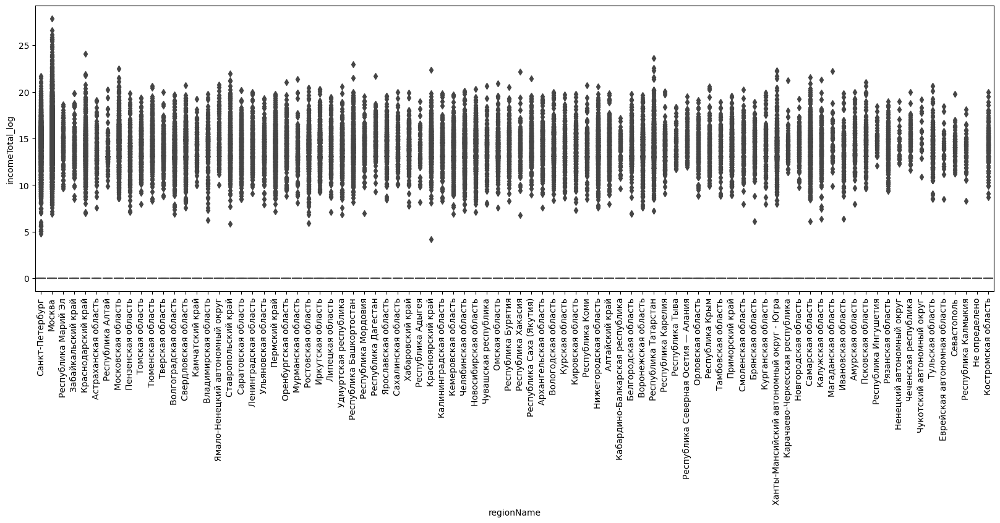

In [39]:
plt.figure(figsize=(20, 6))  # Установим размер графика

sns.boxplot(x='regionName', y='incomeTotal_log', data=df)
plt.xticks(rotation=90)  # Поворачиваем метки по оси x для лучшей читаемости

plt.show()


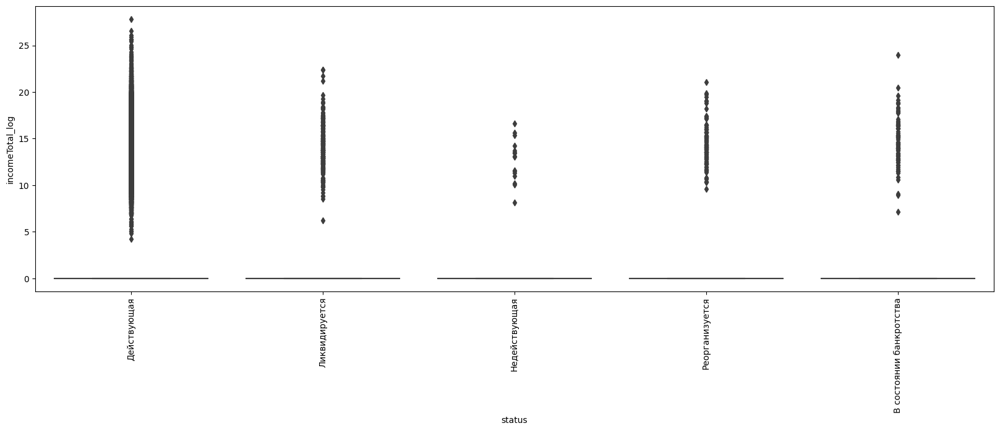

In [40]:
plt.figure(figsize=(20, 6))

sns.boxplot(x='status', y='incomeTotal_log', data=df)
plt.xticks(rotation=90) 

plt.show()

Как видно из графиков распределения субсидий в разрезе субъектов Федерации, существуют регионы с значительно бОльшими максимальными суммами. Среди них особенно выделяется Москва, Московская область, Республица Татарстан, Краснодарский край и некоторые другие субъекты. 

Однако, стоит отметить что в целом в данных наблюдается относительная равномерность порядков сумм, получаемых отдельными организациями в разрезе субъектов.

In [41]:
# признак возраста в годах на момент сбора данных
df['years_old'] = round((pd.to_datetime('26.08.2021') - df['date_foundation']).dt.days / 365).astype(int)
df['years_old'].describe()

C:\Users\Lukyanenko\AppData\Local\Temp\ipykernel_2580\638991464.py:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df['years_old'] = round((pd.to_datetime('26.08.2021') - df['date_foundation']).dt.days / 365).astype(int)


count    296382.000000
mean         13.348655
std          10.250409
min           0.000000
25%           5.000000
50%          11.000000
75%          21.000000
max          99.000000
Name: years_old, dtype: float64

In [42]:
# булевый признак наличия какого-либо дохода с источником - государство
df['have_income'] = df['incomeTotal'] > 0
df['have_income'].sum()
# 27788 


27298

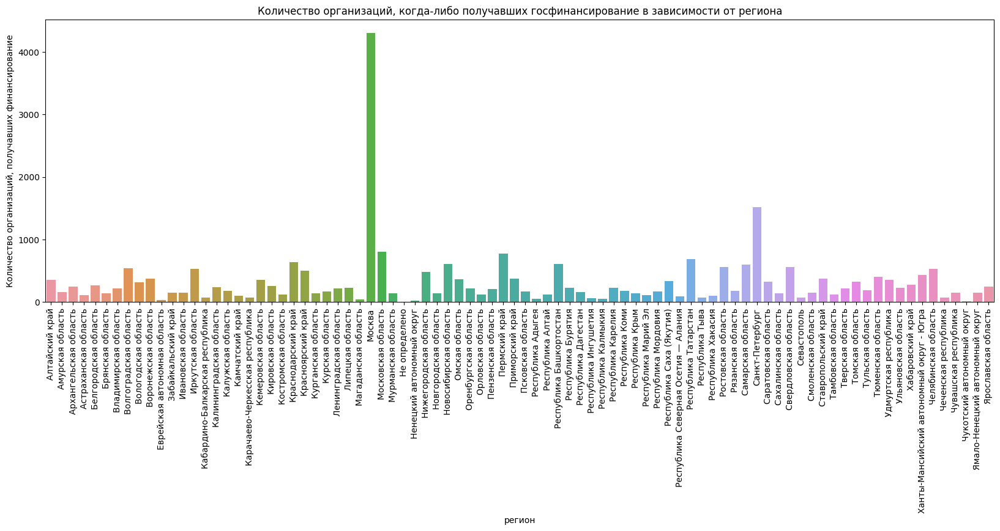

In [43]:
grouped_data = df.groupby('regionName')['have_income'].sum().reset_index()

plt.figure(figsize=(20, 6))
sns.barplot(x='regionName', y='have_income', data=grouped_data)

plt.title('Количество организаций, когда-либо получавших госфинансирование в зависимости от региона')
plt.xlabel('регион')
plt.ylabel('Количество организаций, получавших финансирование')
plt.xticks(rotation=90)
plt.show()

На графике можно видеть, как неоднородно распределено количество субсидированных нко по территории РФ.

Закономерность распределения несколько соотносится с количетсвом проживающего в субъекте населения. 
Просматривается прямая зависимость между профицитом бюджета субъекта и количетсвом организаций, но встречаются и исключения в обоих направлениях.

Неоспоримо выделяется лишь число организаций, получавших субсидии, зарегистрированных в городах федерального значения.

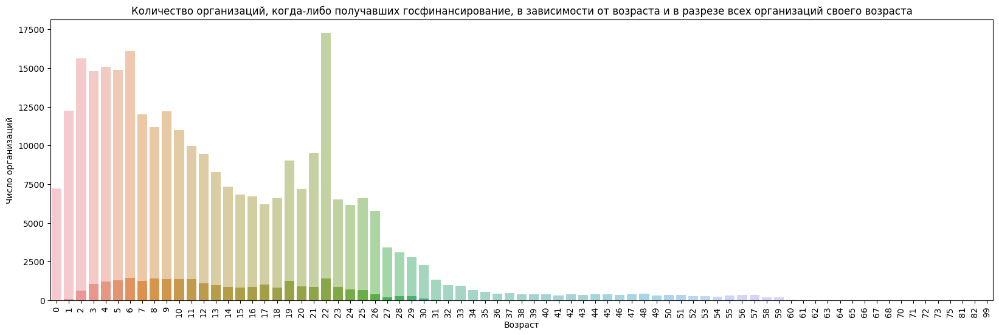

In [44]:
grouped_data = df.groupby('years_old')['have_income'].sum().reset_index()
grouped_data_total = df.groupby('years_old').count().reset_index()

plt.figure(figsize=(20, 6))

# Первый слой с группированным числом получателей (получивших госфинансирование хотя бы раз за существование)
sns.barplot(x='years_old', y='have_income', data=grouped_data, label='С финансированием')

# Второй слой всех организаций
sns.barplot(x='years_old', y='have_income', data=grouped_data_total, alpha=0.5, label='Все организации')

plt.title('Количество организаций, когда-либо получавших госфинансирование, в зависимости от возраста и в разрезе всех организаций своего возраста')
plt.xlabel('Возраст')
plt.ylabel('Число организаций')
plt.xticks(rotation=90)

plt.show()

Кажется любопытным, что вероятность того, что та или иная организация со временем имеет шансы получить какую-либо господдержку не растёт линейно. Таким образом, можно сделать вывод, что большая часть организаций создаётся и функционирует с такими целями, экономическими моделями и в таких условиях, которые не подразумевают возможность получения госфинансирования на протяжении всего своего существования.

Отдельно стоит отметить, что каждый год возникает сравнительно одинаковое количество организаций, получавших те или иные выплаты единожды и более.
Возможно, причина этого кроется не столько в "равномерном нарастании" третичного сектора, требущих финансирования, а в строгом лимитировании выделяемых на финансирование средств.

In [45]:
# Создаем словарь соответствия code и name
okved_mapping = OKVD.set_index('code')['name'].to_dict()

# Временно обавим новый столбец с расшифрованным оквд
df['mainOkved_long'] = df['mainOkved'].map(okved_mapping)

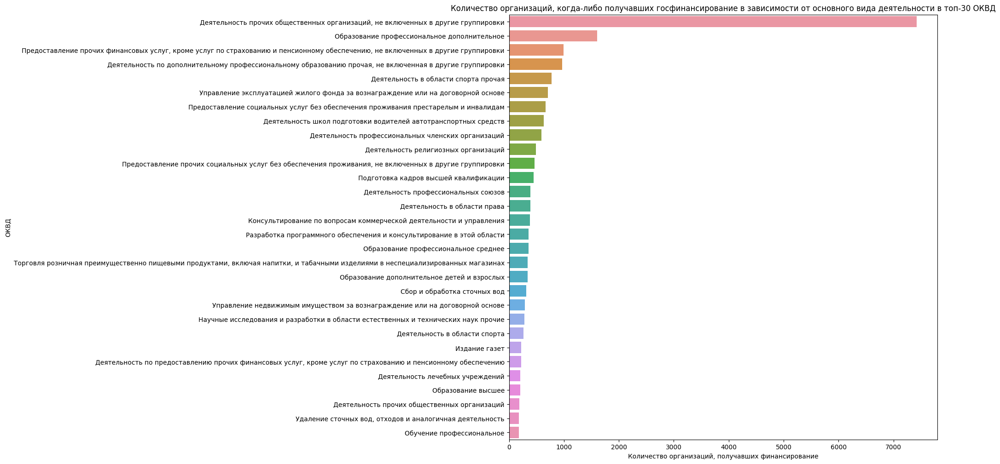

In [46]:
grouped_data = df.groupby('mainOkved_long')['have_income'].sum().reset_index()

grouped_filtered = grouped_data.nlargest(30, 'have_income') # в данных есть более 1000 ОКВД, посмотрим только на самые часто встречающиеся

grouped_filtered = grouped_filtered.sort_values(by='have_income', ascending=False)

plt.figure(figsize=(12, 12))
sns.barplot(y='mainOkved_long', x='have_income', data=grouped_filtered)

plt.title('Количество организаций, когда-либо получавших госфинансирование в зависимости от основного вида деятельности в топ-30 ОКВД')
plt.xlabel('Количество организаций, получавших финансирование')
plt.ylabel('ОКВД')
plt.show()

Любопытно, что признак ОКВД оказывается не всеобъемлющим, несмотря на наличие более 1000 уникальных значений. Около четверти организаций, получавших деньги от государства заняты в видах деятельности, не включенных ни в один из установленных видов ОКВД. 

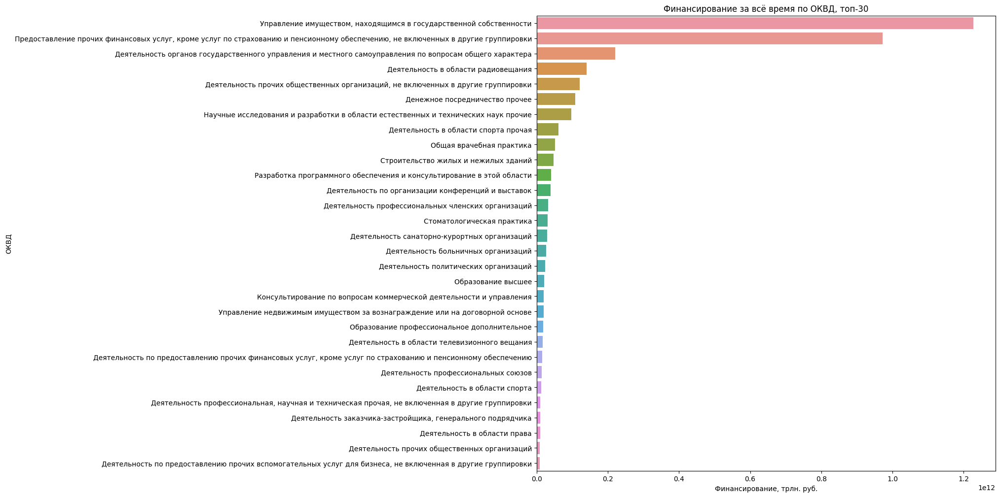

In [47]:
grouped_data = df.groupby('mainOkved_long')['incomeTotal'].sum().reset_index()

grouped_filtered = grouped_data.nlargest(30, 'incomeTotal') # в данных есть более 1000 ОКВД, посмотрим только на самые часто встречающиеся

grouped_filtered = grouped_filtered.sort_values(by='incomeTotal', ascending=False)

plt.figure(figsize=(12, 12))
sns.barplot(y='mainOkved_long', x='incomeTotal', data=grouped_filtered)

plt.title('Финансирование за всё время по ОКВД, топ-30')
plt.xlabel('Финансирование, трлн. руб.')
plt.ylabel('ОКВД')
plt.show()

Можно увидеть, что организации с наиболее популярными ОКВД и список крупнейших сумм, полученных организациями с определенным ОКВД значительно разнятся. Здесь можно говорить и о количественном превуалировании относительно мелких организаций, например, занимающихся профессиональным образованием, и о строгой консолидации государствоми крупнейших денежных потоков, например, в распределении финансов в госимуществе и специфических финансовых услугах населению.

### Вывод
Исходя из проведенного поверхностного анализа данных становится ясно, что подтверждаются базовые теоррии о зависимости целевой переменной от таких факторов как:

1. регион регистрации организации;

2. экономическая деятельность организации - ОКВД.

Год основания организации влияет на шанс получения финансирования незначительно.

Можно приступать к кодированию категориальных признаков

### Кодирование и отбор признаков

In [48]:
# Применяем бинарное кодирование для категориальных признаков с большим количеством категорий

bin_encoder = ce.BinaryEncoder(cols=['regionName', 'ogrn', 'opf', 'mainOkved', 'okpo', 'okogu', 'kpp', 'okfs', 'years_old'])  # указываем столбцы для кодирования
type_bin = bin_encoder.fit_transform(df[['regionName', 'ogrn', 'opf', 'mainOkved', 'okpo', 'okogu', 'kpp', 'okfs', 'years_old']])
coded_df = pd.concat([df, type_bin], axis=1)

#Применяем onehot encoder для признаков с малым количеством категорий

encoder = ce.OneHotEncoder(cols=['minjustForm', 'egrulStatus'], use_cat_names=True) # указываем столбец для кодирования
type_bin = encoder.fit_transform(df[['minjustForm', 'egrulStatus']])
coded_df = pd.concat([coded_df, type_bin], axis=1)

coded_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 296382 entries, 0 to 747012
Columns: 154 entries, regionName to egrulStatus_Действует
dtypes: bool(3), datetime64[ns](1), float64(4), int32(1), int64(135), object(10)
memory usage: 343.4+ MB


In [49]:
# Снова сократим
coded_df = coded_df.drop(['addOkvd_number' ,'incomeTotal_log', 'kpp', 'date_foundation', 'regionName', 'minjustForm', 'opf', 'egrulStatus', 'mainOkved', 'okogu', 'addOkved', 'okfs', 'status', 'mainOkved_long'], axis=1)

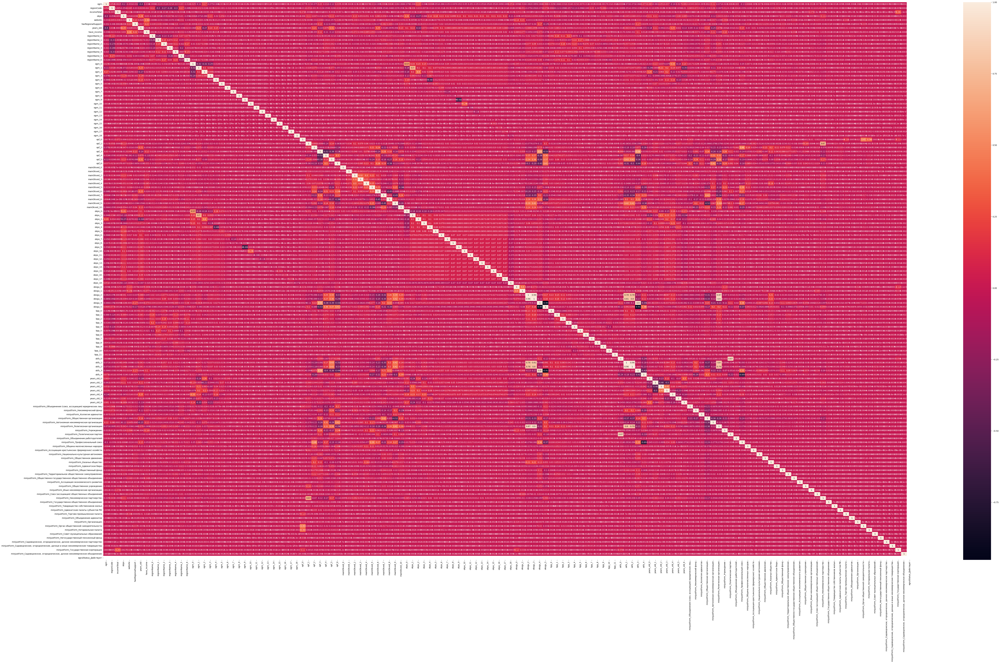

In [50]:
plt.figure(figsize = (90, 50))
sns.heatmap(coded_df.corr(), annot = True);

На графике корреляций можно увидеть, что подготовленные данные достаточно информативны. Однако, существует некотрые признаки мультиколлиниарности в областях пересечения okogu и okfs, а так же видны проблемы аномальной зависимостью признаков у столбцов религиозных и политичсеких организаций. Имеет смысл попробовать отказаться от этих признаков.

In [51]:
#избавляемся от нескольких сильно коррелирующих признаков
coded_df = coded_df.drop(['okogu_3', 'okogu_2', 'okogu_5', 'okfs_1', 'okfs_3', 'okfs_4', 'minjustForm_Религиозная организация', 'minjustForm_Политическая партия'], axis=1)

In [52]:
coded_df_regr = coded_df.drop(['incomeTotal'], axis=1) #уберём ytлогарифмированную переменную, чтобы избежать утечки данных

# Разобьём данные на обучающую и тестовую выборку

X = coded_df_regr.drop(['have_income'], axis=1)
y = coded_df_regr['have_income']

print('shape:', X.shape)

# отбираем лучшие признаки относительно влияния на целевой
X_new = SelectKBest(chi2, k=20).fit_transform(X, y)
print('shape:', X_new.shape)
 
X_train, X_test, y_train, y_test = train_test_split(X_new, y, random_state = 42, test_size = 0.33, stratify=y)

shape: (296382, 130)
shape: (296382, 20)


In [53]:
# Применяем SelectKBest и хи-квадрат тест
selector = SelectKBest(chi2, k=40)
X_new = selector.fit_transform(X, y)

# Получаем степень влияния (хи-квадрат статистику и p-значение) для каждого признака
chi2_scores = selector.scores_
p_values = selector.pvalues_

# Создаем DataFrame, чтобы отобразить имена признаков, статистику и p-значения
feature_scores = pd.DataFrame({'Feature': X.columns, 'Chi2 Score': chi2_scores, 'P-Value': p_values})

# Сортируем по степени влияния (хи-квадрат статистике) от большей к меньшей
sorted_feature_scores = feature_scores.sort_values(by='Chi2 Score', ascending=False)

# Выводим отсортированную степень влияния
print(sorted_feature_scores)

                                            Feature    Chi2 Score   P-Value
0                                              ogrn  6.856347e+12  0.000000
2                                              okpo  5.462890e+09  0.000000
3                                           website  3.710538e+04  0.000000
4                                hasRegionalSupport  1.364514e+04  0.000000
98                           minjustForm_Учреждение  7.053325e+03  0.000000
..                                              ...           ...       ...
110  minjustForm_Ассоциация экономического развития  3.129914e-02  0.859575
83                                           kpp_11  7.787313e-03  0.929681
27                                          ogrn_14  6.536543e-03  0.935562
19                                           ogrn_6  6.133572e-03  0.937576
129                           egrulStatus_Действует  0.000000e+00  1.000000

[130 rows x 3 columns]


Производим нормализацию данных

In [54]:
scaler = preprocessing.MinMaxScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

# Часть 3. Решение задачи классификации: получалось ли организацией какое-либо финансирование?

## Логистическая регрессия

Попробуем построить базовую модель, предсказывающую, получала ли организация финансрование когда-либо или нет. Используем логистическую регрессию.

In [55]:
# обучим логистическую регрессию

log_reg = linear_model.LogisticRegression(
        solver='lbfgs',  # в соответсвии с документацией, были испытаны несколько вариантов solver, 
                         # for multiclass problems, only ‘newton-cg’, ‘sag’, ‘saga’ and ‘lbfgs’ handle multinomial loss
        random_state=42, 
        max_iter=1000 
        )

#Обучаем модель, минимизируя logloss
log_reg.fit(X_train, y_train)

print("accuracy на тестовом наборе: {:.2f}".format(log_reg.score(X_test, y_test)))
y_test_pred = log_reg.predict(X_test)
print('precision_score на тестовом наборе: {:.2f}'.format(metrics.precision_score(y_test, y_test_pred, zero_division=1)))
print('recall_score на тестовом наборе: {:.2f}'.format(metrics.recall_score(y_test, y_test_pred, zero_division=1)))
print('f1_score на тестовом наборе: {:.2f}'.format(metrics.f1_score(y_test, y_test_pred, zero_division=1)))
# accuracy на тестовом наборе: 0.92
# precision_score на тестовом наборе: 0.82
# recall_score на тестовом наборе: 0.17
# f1_score на тестовом наборе: 0.28

# как можно увидеть, значения метрик не самые лучшие. Возможно, проблема в несбалансированности классов, возможно, в более сложной зависимости в данных

accuracy на тестовом наборе: 0.92
precision_score на тестовом наборе: 0.82
recall_score на тестовом наборе: 0.17
f1_score на тестовом наборе: 0.28


## CART
Перейдём к решению задачи бинарной классификации методом CART.

In [56]:
# взглянем на алгоритм случайного леса, c произвольно выбранной глубиной - 10

dt = tree.DecisionTreeClassifier(
    criterion='entropy',
    random_state=42,
    max_depth = 10
)

dt.fit(X_train, y_train)

y_test_pred = dt.predict(X_test)

print("accuracy на тестовом наборе: {:.2f}".format(dt.score(X_test, y_test)))
print('precision_score на тестовом наборе: {:.2f}'.format(metrics.precision_score(y_test, y_test_pred)))
print('recall_score на тестовом наборе: {:.2f}'.format(metrics.recall_score(y_test, y_test_pred)))
print('f1_score на тестовом наборе: {:.2f}'.format(metrics.f1_score(y_test, y_test_pred)))
# accuracy на тестовом наборе: 0.92
# precision_score на тестовом наборе: 0.81
# recall_score на тестовом наборе: 0.19
# f1_score на тестовом наборе: 0.31

#Удалось достичь плачевного, но результата. Алгоритм сумел показать 31% f1, 
#определенно с более точной настройкой гиперпараметров можно достичь лучших показателей

accuracy на тестовом наборе: 0.92
precision_score на тестовом наборе: 0.81
recall_score на тестовом наборе: 0.19
f1_score на тестовом наборе: 0.31


In [57]:
metrics.confusion_matrix(y_test, y_test_pred)

array([[88383,   416],
       [ 7280,  1728]], dtype=int64)

In [58]:
#Отберём сразу несколо вариантов гиперпараметров для деревьев решений при помощи gridseachCV

parameters =  {'min_samples_split': [2, 5, 7, 10, 15], 'max_depth':[3,5,7,10,15,20]}

model_cv = GridSearchCV(tree.DecisionTreeClassifier(), 
                        parameters,
                        cv=3, scoring=('f1'), 
                        return_train_score=True)

model_cv.fit(X_train, y_train)

y_test_pred = model_cv.predict(X_test)

print("accuracy на тестовом наборе: {:.2f}".format(model_cv.score(X_test, y_test)))
print('precision_score на тестовом наборе: {:.2f}'.format(metrics.precision_score(y_test, y_test_pred)))
print('recall_score на тестовом наборе: {:.2f}'.format(metrics.recall_score(y_test, y_test_pred)))
print('f1_score на тестовом наборе: {:.2f}'.format(metrics.f1_score(y_test, y_test_pred)))
# accuracy на тестовом наборе: 0.36
# precision_score на тестовом наборе: 0.47
# recall_score на тестовом наборе: 0.29
# f1_score на тестовом наборе: 0.36

#Всё плохо. Значение accuracy b f1-меры упало до 35%

accuracy на тестовом наборе: 0.35
precision_score на тестовом наборе: 0.54
recall_score на тестовом наборе: 0.26
f1_score на тестовом наборе: 0.35


Попробуем оптимизировать гиперпараметры с помощью optuna.

In [59]:
def optuna_rf(trial):
  # задаем пространства поиска гиперпараметров
  n_estimators = trial.suggest_int('n_estimators', 100, 200, 1);
  max_depth = trial.suggest_int('max_depth', 10, 35, 1);
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 30, 1)
  criterions = trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss'])

  # создаем модель
  model = ensemble.RandomForestClassifier(n_estimators=n_estimators,
                                          max_depth=max_depth,
                                          min_samples_leaf=min_samples_leaf,
                                          criterion=criterions,
                                          random_state=42)
  # обучаем модель
  model.fit(X_train, y_train)
  score = metrics.f1_score(y_train, model.predict(X_train))

  return score

study = optuna.create_study(study_name="RandomForestClassifier", direction="maximize")
# ищем лучшую комбинацию гиперпараметров n_trials раз
study.optimize(optuna_rf, n_trials=20)

[I 2023-11-02 18:24:16,191] A new study created in memory with name: RandomForestClassifier
[I 2023-11-02 18:25:28,263] Trial 0 finished with value: 0.3558137503275967 and parameters: {'n_estimators': 174, 'max_depth': 22, 'min_samples_leaf': 5, 'criterion': 'entropy'}. Best is trial 0 with value: 0.3558137503275967.
[I 2023-11-02 18:26:06,930] Trial 1 finished with value: 0.30043074132849695 and parameters: {'n_estimators': 120, 'max_depth': 32, 'min_samples_leaf': 22, 'criterion': 'gini'}. Best is trial 0 with value: 0.3558137503275967.
[I 2023-11-02 18:27:10,739] Trial 2 finished with value: 0.36817215497418543 and parameters: {'n_estimators': 172, 'max_depth': 21, 'min_samples_leaf': 4, 'criterion': 'gini'}. Best is trial 2 with value: 0.36817215497418543.
[I 2023-11-02 18:27:50,590] Trial 3 finished with value: 0.3025392658308062 and parameters: {'n_estimators': 110, 'max_depth': 35, 'min_samples_leaf': 21, 'criterion': 'log_loss'}. Best is trial 2 with value: 0.36817215497418543.

In [60]:
print("Наилучшие значения гиперпараметров {}".format(study.best_params))
print("f1_score на обучающем наборе: {:.2f}".format(study.best_value))

Наилучшие значения гиперпараметров {'n_estimators': 105, 'max_depth': 25, 'min_samples_leaf': 2, 'criterion': 'gini'}
f1_score на обучающем наборе: 0.49


In [61]:
# рассчитаем точность для тестовой выборки
model = ensemble.RandomForestClassifier(**study.best_params,random_state=42 )
model.fit(X_train, y_train)
y_train_pred = model.predict(X_train)
print("accuracy на тестовом наборе: {:.2f}".format(model.score(X_test, y_test)))
y_test_pred = model.predict(X_test)
print('f1_score на тестовом наборе: {:.2f}'.format(metrics.f1_score(y_test, y_test_pred)))

accuracy на тестовом наборе: 0.92
f1_score на тестовом наборе: 0.34


In [83]:
# При необходимости визуализируем дерево решений в виде графа, однако, из-за высокой ветвистости визуализация будет сложно читаемой

# fig = plt.figure(figsize=(15, 7))
# tree_graph = tree.plot_tree(
#     model, #дерево решений
#     feature_names=X.columns, #имена факторов
#     filled=True, #расцветка
#     impurity=False, #отображать ли неоднородность
# );

In [62]:
optuna.visualization.plot_optimization_history(study, target_name="f1_score")

In [63]:
optuna.visualization.plot_contour(study, params=["max_depth", "n_estimators"],
                                  target_name="f1_score")

После применения оптимизации гиперпараметров и обучения нескольких моделей всё ещё не получены качественные результаты:

* accuracy на тестовом наборе: 0.92
* f1_мера на тестовом наборе: 0.36

## Классификатор на основе градиентного бустинга

In [64]:
gb = GradientBoostingClassifier(
    loss='deviance', #функция потерь
    learning_rate=0.2, #темп обучения
    n_estimators=200, #число деревьев
    max_depth=35, #максимальная глубина дерева
    random_state=42, #генератор случайных чисел
    min_samples_leaf=2
)
# Обучаем модель
gb.fit(X_train, y_train)
# Формируем предсказание для тестовой выборки
y_pred = gb.predict(X_test)
# Посмотрим на основные метрики классификации
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.93      0.96      0.95     88799
        True       0.43      0.30      0.35      9008

    accuracy                           0.90     97807
   macro avg       0.68      0.63      0.65     97807
weighted avg       0.88      0.90      0.89     97807



In [65]:
#пройдёмся по гиперпараметрам алгоритма градиентного бустинга с помощью optuna

def optuna_gb(trial):
  # задаем пространства поиска гиперпараметров
  loss_criterion = trial.suggest_categorical('criterion', ['log_loss', 'deviance', 'exponential'])
  n_estimators = trial.suggest_int('n_estimators', 100, 200, 1);
  max_depth = trial.suggest_int('max_depth', 7, 30, 1);
  min_samples_leaf = trial.suggest_int('min_samples_leaf', 2, 30, 1)

  # создаем модель
  model = ensemble.GradientBoostingClassifier(loss=loss_criterion,
                                              learning_rate=0.2, 
                                              n_estimators=n_estimators, 
                                              max_depth=max_depth, 
                                              random_state=42, 
                                              min_samples_leaf=min_samples_leaf
                                              )
  # обучаем модель
  model.fit(X_train, y_train)
  score = metrics.f1_score(y_train, model.predict(X_train))

  return score

study = optuna.create_study(study_name="GradientBoostingClassifier", direction="maximize")
# ищем лучшую комбинацию гиперпараметров n_trials раз
study.optimize(optuna_gb, n_trials=10)

[I 2023-11-02 19:01:38,153] A new study created in memory with name: GradientBoostingClassifier
[I 2023-11-02 19:09:02,838] Trial 0 finished with value: 0.7915219578694538 and parameters: {'criterion': 'deviance', 'n_estimators': 146, 'max_depth': 22, 'min_samples_leaf': 21}. Best is trial 0 with value: 0.7915219578694538.
[I 2023-11-02 19:18:06,360] Trial 1 finished with value: 0.8658664204370575 and parameters: {'criterion': 'exponential', 'n_estimators': 191, 'max_depth': 20, 'min_samples_leaf': 12}. Best is trial 1 with value: 0.8658664204370575.
[I 2023-11-02 19:24:43,252] Trial 2 finished with value: 0.7439671976877058 and parameters: {'criterion': 'deviance', 'n_estimators': 131, 'max_depth': 24, 'min_samples_leaf': 29}. Best is trial 1 with value: 0.8658664204370575.
[I 2023-11-02 19:31:43,627] Trial 3 finished with value: 0.6271812694347905 and parameters: {'criterion': 'exponential', 'n_estimators': 190, 'max_depth': 16, 'min_samples_leaf': 29}. Best is trial 1 with value: 0.

In [66]:
optuna.visualization.plot_optimization_history(study, target_name="f1_score")

In [67]:
optuna.visualization.plot_contour(study, params=["max_depth", "n_estimators"],
                                  target_name="f1_score")

In [68]:
print("Наилучшие значения гиперпараметров {}".format(study.best_params))
print("f1_score на обучающем наборе: {:.2f}".format(study.best_value))

Наилучшие значения гиперпараметров {'criterion': 'log_loss', 'n_estimators': 132, 'max_depth': 29, 'min_samples_leaf': 10}
f1_score на обучающем наборе: 0.96


In [74]:
# рассчитаем точность gd для тестовой выборки
gb_best = GradientBoostingClassifier( # **study.best_params
    loss='log_loss', #функция потерь
    learning_rate=0.2, #темп обучения
    n_estimators=132, #число деревьев
    max_depth=29, #максимальная глубина дерева
    random_state=42, #генератор случайных чисел
    min_samples_leaf=10
    )

gb_best.fit(X_train, y_train)
# Формируем предсказание для тестовой выборки
y_pred = gb_best.predict(X_test)
# Посмотрим на основные метрики классификации
print(classification_report(y_test, y_pred))

#               precision    recall  f1-score   support

#        False       0.93      0.97      0.95     88799
#         True       0.47      0.30      0.37      9008

#     accuracy                           0.90     97807
#    macro avg       0.70      0.63      0.66     97807
# weighted avg       0.89      0.90      0.89     97807

              precision    recall  f1-score   support

       False       0.93      0.97      0.95     88799
        True       0.47      0.30      0.37      9008

    accuracy                           0.90     97807
   macro avg       0.70      0.63      0.66     97807
weighted avg       0.89      0.90      0.89     97807



В результате метрики стали выгляеть лучше, но по прежнему присутствует существенный перевес на тестовых данных в нахождении ошибок второго рода.

# Часть 4. Подготовка модели к продакшену

In [85]:
# Производим сериализацию обученной модели
model = pickle.dumps(gb_best)

print(type(model))
print(type(gb_best))

#Сохраним модель
with open('gb_model_predict_goverment_finans_in_nonprofit_organizations_Russia.pkl', 'wb') as output:
    pickle.dump(gb_best, output)

<class 'bytes'>
<class 'sklearn.ensemble._gb.GradientBoostingClassifier'>


In [91]:
# Создаём пайплайн, который включает преобразование, отбор признаков и обучение модели
pipe = Pipeline([  
  ('Scaling', ce.BinaryEncoder(cols=['regionName', 'ogrn', 'opf', 'mainOkved', 'okpo', 'okogu', 'kpp', 'okfs', 'years_old'])),
  ('Encoder', ce.OneHotEncoder(cols=['minjustForm', 'egrulStatus'], use_cat_names=True)),
  ('FeatureSelection', SelectKBest(chi2, k=20)),
  ('GradBoosting', GradientBoostingClassifier(loss='log_loss', 
                                              learning_rate=0.2, 
                                              n_estimators=132, 
                                              max_depth=29, 
                                              random_state=42, 
                                              min_samples_leaf=10
                                              ))])
# Обучаем пайплайн
pipe.fit(X, y)

# Выводы по проекту



### В процессе работы над проектом удалось:

* столкнуться и поработать с реальными данными,
* начать глубже разбираться в системе, структуре и регулировании госфинансирования нко в РФ,
* попрактиковаться в разведывательном анализе данных,
* очистке данных,
* визуализации,
* создании моделей машинного обучения.

### В результате работы
получилось создать ml-модель, предсказывающую с 90% шансом верный результат на вопрос о получении нко финансирования.
Проблема заключается в том, что значения метрик precision и recall сильно отличаются, т.е. модель даёт на выходе ошибки первого и второго рода с разной вероятностью.
В текущем виде модель намного точнее спрогнозирует вероятность неполучение каких-либо субсидий, чем возможность их получения. Увеличение точности одного прогноза неизбежно приведёт к уменьшению точности другого.
Ошибки какого рода менее желательны -- вопрос скорее каждого частного случая. Однако, автор считает, что точность предсказания отсутствия финансирования со стороны государства более важна с точки зрения планирования деятельности и менеджмента ресурсов организации.

### Направления улучшения
Несмотря на проделанную работу, проект по прежнему можно улучшить в нескольких направлениях:

* использовать обновленные данные,
* провести более глубокую проработку признаков, попытаться использовав дополнительные временные данные по целевому признаку,
* провести стратификацию финансирования по отдельным ФЗ,
* провести поиск паттернов в финансировании методами кластеризации,
* воспользоваться дополнительными источниками информации, как, например, порталом "Госзатрат",

* добавить больше прикладной статистики и конкретики в выводы в разделе EDA,

* воспользоваться другими, более совершенными ml-фреймворками,
* попытаться изменить тип решаемой задачи с классификации на регрессию и предсказать получаемый доход (в данных есть информация почти о 30 тысячах очень разных получателей),
* прописать более совершенные pipelin-ы и отдельные приложения client-server.

### Дополнение
Отдельным пунктами вывода работы хочется выделить следующее: 
* понимание ценности экспретного знания (и необходимости дополнительных больших затрат времени на ознакомление с природой данных в случае малой экспертизы в предметной области) при обработке данных,
* необходимость тщательного ознакомления и предварительного обсуждения задачи, планирование и согласование формы и структуры планируемого результата. 